# Import necessary libraries

In [ ]:
import requests
from PIL import Image
import io
from IPython.display import display, Markdown

# Set the base URL for the API

In [ ]:
base_url = "http://127.0.0.1:5000"

# API Instructions from the '/' endpoint

In [23]:
# Send GET request to the '/' endpoint
response = requests.get(base_url + "/")
display(Markdown("## API Instructions"))
display(Markdown("### Response JSON:"))
display(response.json())

## API Instructions

### Response JSON:

{'message': 'Welcome to  the Flask Route API Application!',
 'usage': {'convert': {'description': 'Convert an image from one format to another.',
   'endpoint': '/convert',
   'method': 'POST',
   'parameters': {'image': 'The image file to convert.',
    'output_format': 'The desired output format. Available formats: JPEG, PNG, BMP, GIF.'}},
  'tokenize': {'description': 'Get token and tag of a provided sentence.',
   'endpoint': '/tokenize',
   'method': 'POST',
   'parameters': {'sentence': 'Sentence provided by the user.'}}}}

# Demonstrate the /convert Endpoint

## Converted Image

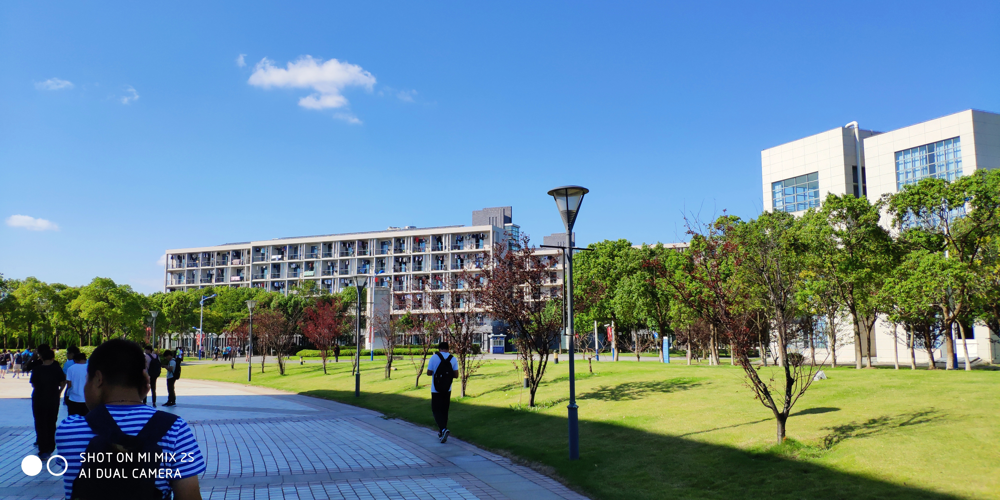

In [25]:
# Send POST request to the '/convert' endpoint with test.jpg
with open("test.jpg", "rb") as image_file:
    files = {"image": image_file}
    data = {"output_format": "PNG"}

    # Send the request
    response = requests.post(base_url + "/convert", files=files, data=data)

    # Display the converted image if the request was successful
    if response.status_code == 200:
        img = Image.open(io.BytesIO(response.content))
        display(Markdown("## Converted Image"))
        display(img)
    else:
        display(Markdown(f"**Error:** {response.json()}"))

# Demonstrate the /convert Endpoint

In [26]:
# Define the sentence to be tokenized
sentence = "I am learning Flask and NLTK."

# Send POST request to the '/tokenize' endpoint
data = {"sentence": sentence}
response = requests.post(base_url + "/tokenize", data=data)

# Display the tokenized and tagged response
display(Markdown("## Tokenized Sentence and Tags"))
display(Markdown(f"**Sentence:** '{sentence}'"))
display(Markdown("### Response JSON:"))
display(response.json())

## Tokenized Sentence and Tags

**Sentence:** 'I am learning Flask and NLTK.'

### Response JSON:

{'sentence': 'I am learning Flask and NLTK.',
 'tagged': [['I', 'PRP'],
  ['am', 'VBP'],
  ['learning', 'VBG'],
  ['Flask', 'NNP'],
  ['and', 'CC'],
  ['NLTK', 'NNP'],
  ['.', '.']],
 'tokens': ['I', 'am', 'learning', 'Flask', 'and', 'NLTK', '.']}